Let's start by creating an instance of the droneMPC class. Initializing in hover and r=l0. Set a reference and call the solve method to see if everything runs through.

In [1]:
from drone.drone_MPC import DroneMPC, DroneMPCOptions
import numpy as np

# Define an initial state corresponding to hovering.
# For the full model, the state is:
# [y, z, phi, r, theta, y_dot, z_dot, phi_dot, r_dot, theta_dot, w1, w2]
# where:
#   - y = 0.0 (horizontal position), z = 1.0 (altitude)
#   - phi (drone pitch) = 0.0, theta (pendulum angle) = 0.0
#   - r is set to the spring rest length (l0)
#   - All velocities are 0.
#   - Rotor speeds (w1, w2) are chosen such that the total thrust equals the weight.
l0 = 0.3
M = 2.0
m = 0.3
M_total = M + m
c = 1
g = 9.81
# Required total thrust for hovering T = (M_total)*g, and assuming symmetric rotors, each rotor speed is set to T/2 (with c=1)
w_val = (M_total * g) / (2.0*c)

# Create an instance of the MPC options (using the updated physical parameters)
opts = DroneMPCOptions(
    M=M,         # drone mass in kg
    m=m,         # load mass in kg (small compared to drone)
    Ixx=0.05,      # moment of inertia in kg·m²
    g=g,        # gravitational acceleration in m/s²
    c=c,         # rotor thrust constant
    L_rot=0.2,     # half distance between rotors in m
    k=2000.0,       # stiff spring (N/m)
    l0=l0,        # spring rest length in m
    # Constraints and cost weighting matrices remain as defined by default

    N = 300,
    switch_stage = 100,
    step_sizes = [0.01]*300,

    w_min = -2*w_val,
    w_max = 2*w_val,
    w_dot_min = -30,
    w_dot_max = 30,
    phi_min = -np.pi*3/10,
    phi_max = np.pi*3/10,
    F_min = -2*w_val*c,
    F_max = 2*w_val*c,

    integrator_type="IRK",

    create_sim=True # Sim creation code not adapted for parametrized subclass
)

# Create an instance of the DroneMPC class
mpc = DroneMPC(opts)

x0 = np.array([
    0.0,    # y position
    1.0,    # z position (hover altitude)
    0.0,    # phi (drone pitch)
    l0,     # r (pendulum length set to rest length)
    0.0,    # theta (pendulum angle)
    0.0,    # y_dot
    0.0,    # z_dot
    0.0,    # phi_dot
    0.0,    # r_dot
    0.0,    # theta_dot
    w_val,  # w1 (rotor speed)
    w_val   # w2 (rotor speed)
])
print("Initial hovering state:", x0)

# Define a reference position far away (for example, [10, 10])
pos_ref = np.array([10.0, 2.0])

# set initial guess to avoid division by zero for r
mpc.set_initial_guess(x0, u_guess=np.zeros(2))

# Call the MPC solve function to compute the first control input
u0 = mpc.solve(x0, pos_ref)
print("First control input:", u0)

The option alpha_min is deprecated and has new name: globalization_alpha_min
The option alpha_reduction is deprecated and has new name: globalization_alpha_reduction
The option eps_sufficient_descent is deprecated and has new name: globalization_line_search_use_sufficient_descent
The option full_step_dual is deprecated and has new name: globalization_full_step_dual
The option line_search_use_sufficient_descent is deprecated and has new name: globalization_line_search_use_sufficient_descent
The option nlp_solver_step_length is deprecated and has new name: globalization_fixed_step_length
The option alpha_min is deprecated and has new name: globalization_alpha_min
The option alpha_min is deprecated and has new name: globalization_alpha_min
The option alpha_reduction is deprecated and has new name: globalization_alpha_reduction
The option alpha_reduction is deprecated and has new name: globalization_alpha_reduction
The option eps_sufficient_descent is deprecated and has new name: globaliza

acados_solver_multiphase_ocp_100_1_200_20250531_050136_164647.c: In function ‘multiphase_ocp_100_1_200_20250531_050136_164647_acados_create_with_discretization’:
acados_solver_multiphase_ocp_100_1_200_20250531_050136_164647.c:2839:25: warning: too many arguments for format [-Wformat-extra-args]
 2839 |         fprintf(stderr, "multiphase_ocp_100_1_200_20250531_050136_164647_acados_create_with_discretization: new_time_steps should be NULL " \
      |                         ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/blasfeo/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/hpipm/include  -c -o drone_full_1748692896164_model/drone_full_1748692896164_impl_dae_fun.o drone_full_1748692896164_model/drone_full_1748692896164_impl_dae_fun.c
cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/blasfeo/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/hpipm/include  -c -o drone_full_1748692896164_model/drone_full_1748692896164_impl_dae_fun_jac_x_xdot_z.o drone_full_17486928961

Next, let's visualize the the openloop plan.

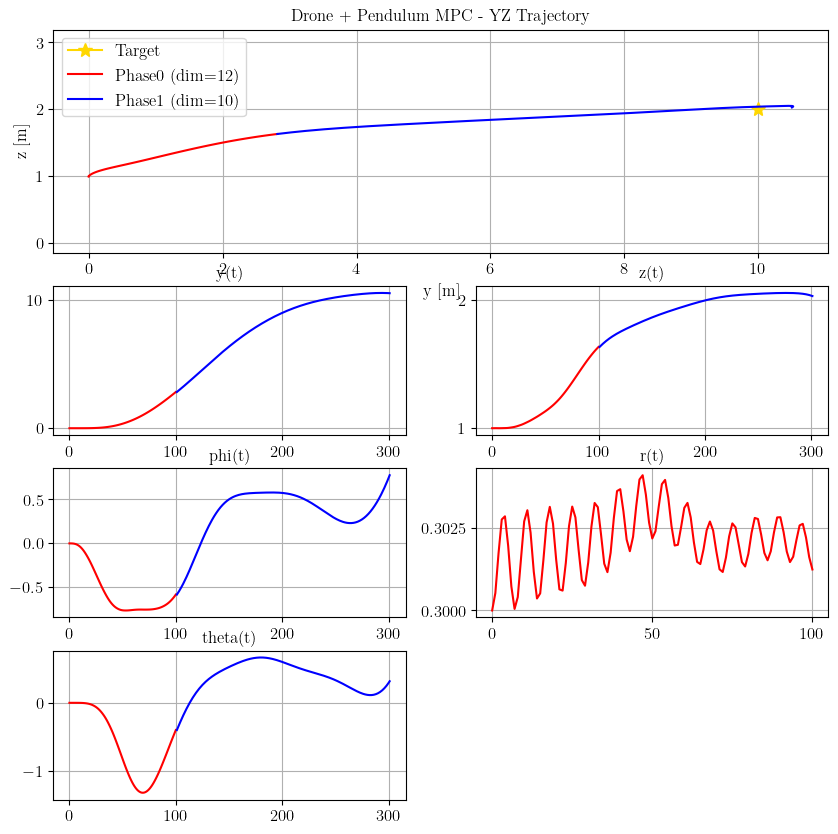

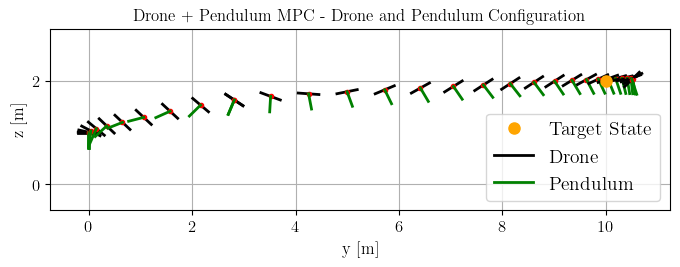

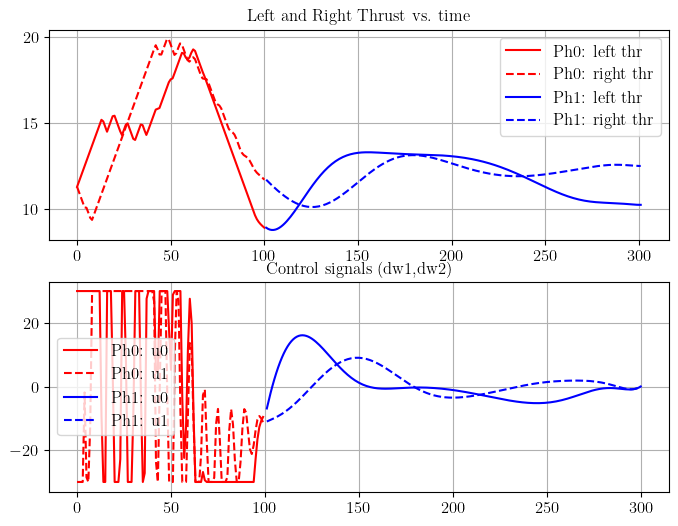

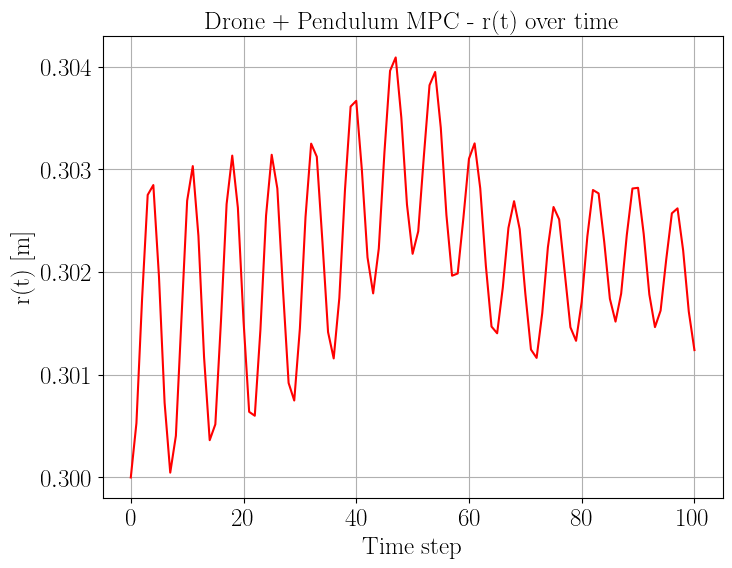

In [2]:
from drone.plotting_utils_drone import plot_drone_mpc_solution

x_traj, u_traj = mpc.get_planned_trajectory()

plot_drone_mpc_solution(
    mpc=mpc, 
    reference_xy=pos_ref,
    open_loop_plan=x_traj,
    u_traj=u_traj,
    step_pose=10
)

We run a comparison of approaches. We treat the model integrated with IRK and a step size of 0.0025 (500 HZ) as ground truth. To show what we have observed, we run:

0.0) Baseline MPC: Exact model, long horizon and small step sizes, integrated with ERK. We use a levenberg-marquardt regularization of the Hessian of 8e-3 (tuned for appropriate convergence). Levenberg-marquardt can slow doen convergence, but helps with problems due to ill-conditioning.

0.1) Same as 0), but integrated with IRK. Shows IRK not necessary.

1.0) Myopic MPC, Same as 0), but with horizon of 100.

2.0) Exact model case, but with larger step sizes (and applied at a higher frequency). Same time horizon as 0)

3.0) Approximate model only, ignore spring in pendulum model. Despite that, as 0)

4.0) Exact model with exponential increase of step sizes at a sensible rate. Same time lookahead as 0)

5.0) Model switching without step size increase, step sizes and horizon as 0)

6.0) Our approach: Combines model switching with an exponential increase of step size


In [3]:
from copy import deepcopy
from drone.utils_drone import simulate_closed_loop_drone
import gc
import shutil

### Setup ###
dt_sim = 0.005 # model with IRK and this stepsize is treated as ground truth here
mpc_opts_sim = deepcopy(opts)
mpc_opts_sim.N = 1
mpc_opts_sim.step_sizes = [dt_sim]*1
mpc_opts_sim.switch_stage = 2
mpc_opts_sim.integrator_type = "IRK"
mpc_sim = DroneMPC(mpc_opts_sim)
sim_solver = mpc_sim.sim_solver_full

del mpc_sim
gc.collect()
shutil.rmtree('c_generated_code', ignore_errors=True)

# collect mean costs and solve times
mean_costs = []
mean_solve_times = []
mean_solve_time_per_iter = []

# MPC config shared by all MPCs 
dt_inital_mpc = 0.01
control_step = int(dt_inital_mpc/dt_sim) # determines zero order hold of the MPC
X0 = np.array([0.0, 1.0, 0.0, l0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, w_val, w_val])
duration = 5.0 # was 5.0

# for plotting
save = True
latexify = True

rm -f libacados_ocp_solver_drone_full_1748692921610.so
rm -f drone_full_1748692921610_cost/drone_full_1748692921610_cost_y_0_fun.o drone_full_1748692921610_cost/drone_full_1748692921610_cost_y_0_fun_jac_ut_xt.o drone_full_1748692921610_cost/drone_full_1748692921610_cost_y_0_hess.o drone_full_1748692921610_cost/drone_full_1748692921610_cost_y_fun.o drone_full_1748692921610_cost/drone_full_1748692921610_cost_y_fun_jac_ut_xt.o drone_full_1748692921610_cost/drone_full_1748692921610_cost_y_hess.o drone_full_1748692921610_cost/drone_full_1748692921610_cost_y_e_fun.o drone_full_1748692921610_cost/drone_full_1748692921610_cost_y_e_fun_jac_ut_xt.o drone_full_1748692921610_cost/drone_full_1748692921610_cost_y_e_hess.o acados_solver_drone_full_1748692921610.o
cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Work

rm -f libacados_ocp_solver_drone_full_1748692929894.so
rm -f drone_full_1748692929894_cost/drone_full_1748692929894_cost_y_0_fun.o drone_full_1748692929894_cost/drone_full_1748692929894_cost_y_0_fun_jac_ut_xt.o drone_full_1748692929894_cost/drone_full_1748692929894_cost_y_0_hess.o drone_full_1748692929894_cost/drone_full_1748692929894_cost_y_fun.o drone_full_1748692929894_cost/drone_full_1748692929894_cost_y_fun_jac_ut_xt.o drone_full_1748692929894_cost/drone_full_1748692929894_cost_y_hess.o drone_full_1748692929894_cost/drone_full_1748692929894_cost_y_e_fun.o drone_full_1748692929894_cost/drone_full_1748692929894_cost_y_e_fun_jac_ut_xt.o drone_full_1748692929894_cost/drone_full_1748692929894_cost_y_e_hess.o acados_solver_drone_full_1748692929894.o
cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Work

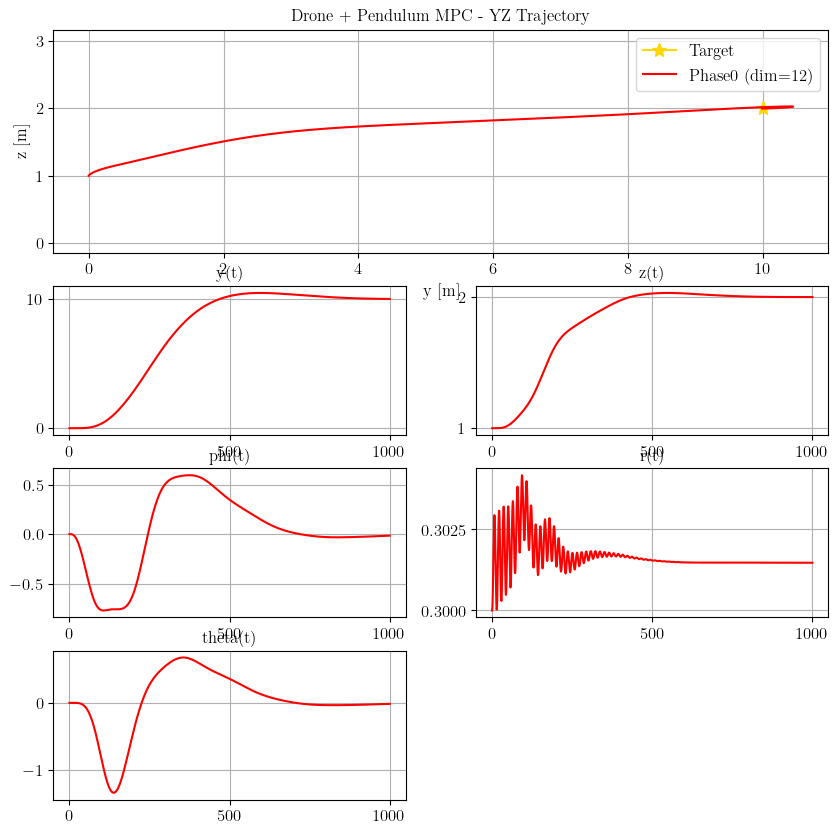

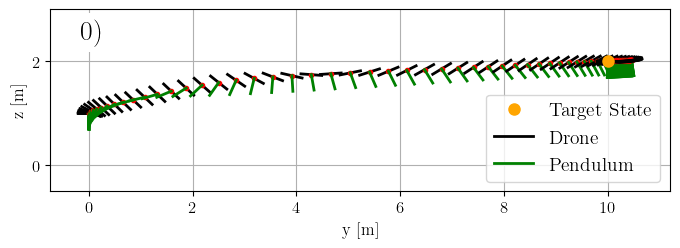

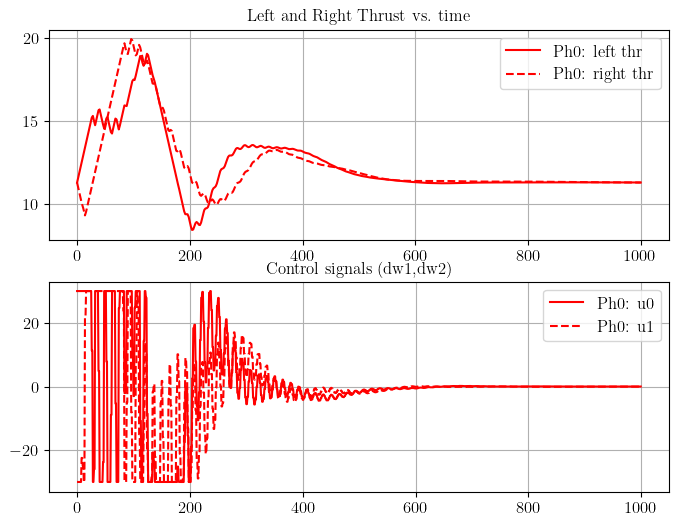

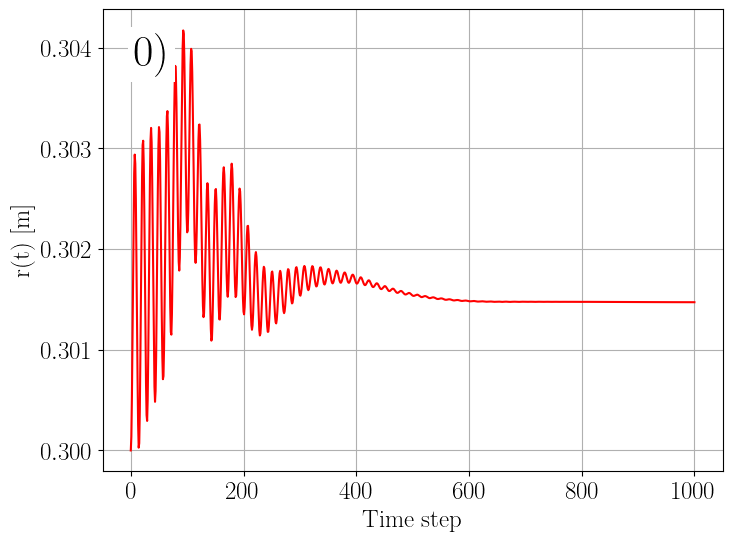

In [4]:
### 0) Baseline MPC ###
mpc_opts_baseline = deepcopy(opts)
N = 150
mpc_opts_baseline.N = N
mpc_opts_baseline.step_sizes = [dt_inital_mpc]*N
mpc_opts_baseline.switch_stage = N+1
mpc_opts_baseline.integrator_type = "ERK"
mpc_opts_baseline.levenberg_marquardt = 8e-3
mpc_baseline = DroneMPC(mpc_opts_baseline)

stage_cost_function=mpc_baseline.stage_cost_func_full # save stage costs function

mpc_baseline.set_initial_guess(X0, u_guess=np.zeros(2))

# simulate
x_traj, u_traj, stage_costs, solve_times, SQP_iters = simulate_closed_loop_drone(
    X0, 
    mpc_baseline, 
    duration, 
    target_xy=pos_ref,
    stage_cost_function=stage_cost_function,
    sigma_noise=0.0,  
    sim_solver=sim_solver, 
    control_step=control_step
)

plot_drone_mpc_solution(
    mpc=mpc_baseline, 
    reference_xy=pos_ref,
    closed_loop_traj=x_traj,
    u_traj=u_traj,
    step_pose=10,
    number=0,
    legend=True,
    save=save,
    latexify=latexify
)

mean_costs.append(np.mean(stage_costs))
mean_solve_times.append(np.mean(solve_times))
solve_times_pre_iter = [t / i if i != 0 else 0 for t, i in zip(solve_times, SQP_iters)]
mean_solve_time_per_iter.append(np.mean(solve_times_pre_iter))

del mpc_baseline
gc.collect()
shutil.rmtree('c_generated_code', ignore_errors=True)

rm -f libacados_ocp_solver_drone_full_1748693261992.so
rm -f drone_full_1748693261992_cost/drone_full_1748693261992_cost_y_0_fun.o drone_full_1748693261992_cost/drone_full_1748693261992_cost_y_0_fun_jac_ut_xt.o drone_full_1748693261992_cost/drone_full_1748693261992_cost_y_0_hess.o drone_full_1748693261992_cost/drone_full_1748693261992_cost_y_fun.o drone_full_1748693261992_cost/drone_full_1748693261992_cost_y_fun_jac_ut_xt.o drone_full_1748693261992_cost/drone_full_1748693261992_cost_y_hess.o drone_full_1748693261992_cost/drone_full_1748693261992_cost_y_e_fun.o drone_full_1748693261992_cost/drone_full_1748693261992_cost_y_e_fun_jac_ut_xt.o drone_full_1748693261992_cost/drone_full_1748693261992_cost_y_e_hess.o acados_solver_drone_full_1748693261992.o
cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Work

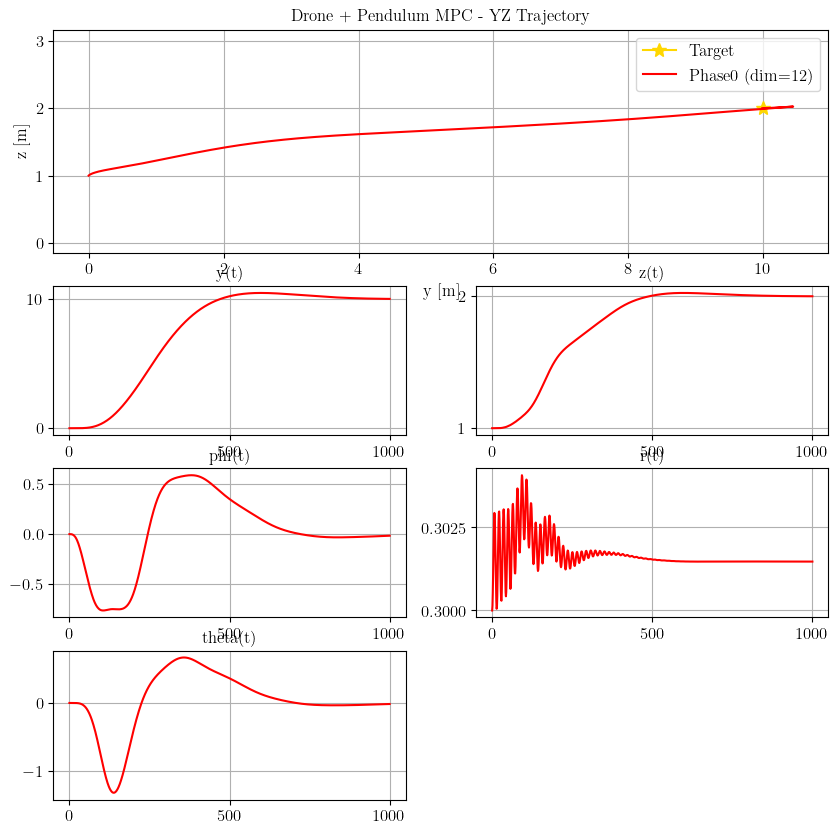

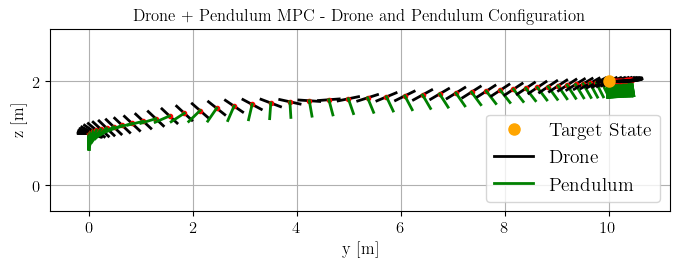

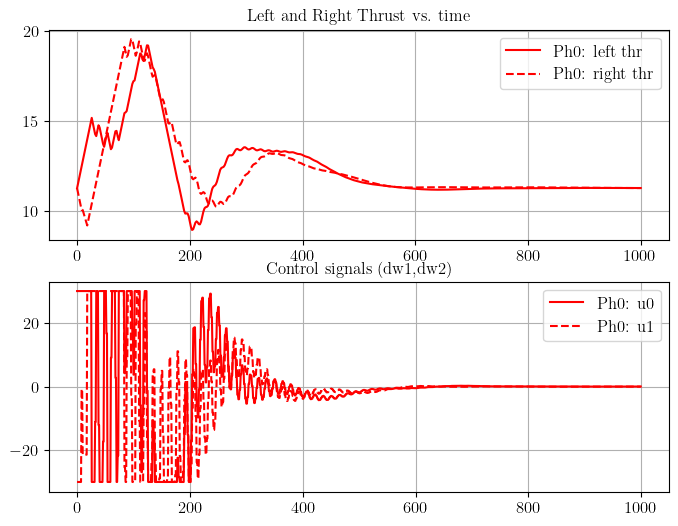

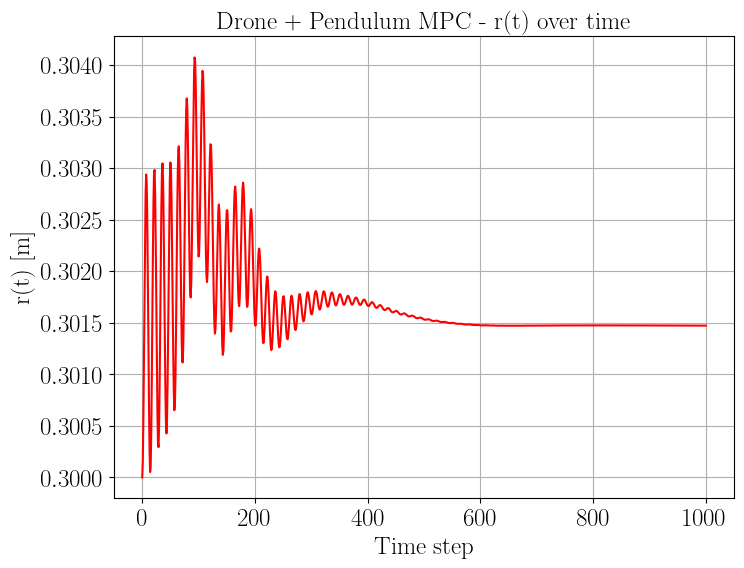

In [5]:
### 0.1) Baseline MPC with IRK ###
mpc_opts_IRK = deepcopy(opts)
N = 150
mpc_opts_IRK.N = N
mpc_opts_IRK.step_sizes = [dt_inital_mpc]*N
mpc_opts_IRK.switch_stage = N+1
mpc_opts_IRK.integrator_type = "IRK"
mpc_opts_IRK.levenberg_marquardt = 8e-3
mpc_IRK = DroneMPC(mpc_opts_IRK)

mpc_IRK.set_initial_guess(X0, u_guess=np.zeros(2))

# simulate
x_traj, u_traj, stage_costs, solve_times, SQP_iters = simulate_closed_loop_drone(
    X0, 
    mpc_IRK, 
    duration, 
    target_xy=pos_ref,
    stage_cost_function=stage_cost_function,
    sigma_noise=0.0,  
    sim_solver=sim_solver, 
    control_step=control_step
)

plot_drone_mpc_solution(
    mpc=mpc_IRK, 
    reference_xy=pos_ref,
    closed_loop_traj=x_traj,
    u_traj=u_traj,
    step_pose=10,
)

# mean_costs.append(np.mean(stage_costs))
# mean_solve_times.append(np.mean(solve_times))
# solve_times_pre_iter = [t / i if i != 0 else 0 for t, i in zip(solve_times, SQP_iters)]
# mean_solve_time_per_iter.append(np.mean(solve_times_pre_iter))

del mpc_IRK
gc.collect()
shutil.rmtree('c_generated_code', ignore_errors=True)

rm -f libacados_ocp_solver_drone_full_1748693804146.so
rm -f drone_full_1748693804146_cost/drone_full_1748693804146_cost_y_0_fun.o drone_full_1748693804146_cost/drone_full_1748693804146_cost_y_0_fun_jac_ut_xt.o drone_full_1748693804146_cost/drone_full_1748693804146_cost_y_0_hess.o drone_full_1748693804146_cost/drone_full_1748693804146_cost_y_fun.o drone_full_1748693804146_cost/drone_full_1748693804146_cost_y_fun_jac_ut_xt.o drone_full_1748693804146_cost/drone_full_1748693804146_cost_y_hess.o drone_full_1748693804146_cost/drone_full_1748693804146_cost_y_e_fun.o drone_full_1748693804146_cost/drone_full_1748693804146_cost_y_e_fun_jac_ut_xt.o drone_full_1748693804146_cost/drone_full_1748693804146_cost_y_e_hess.o acados_solver_drone_full_1748693804146.o
cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Work

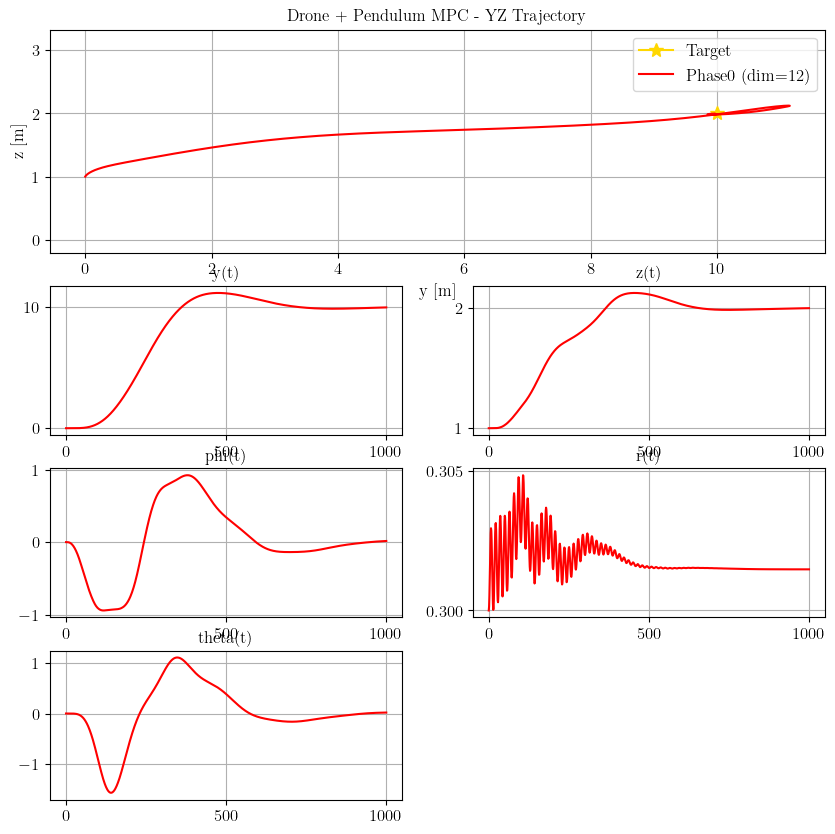

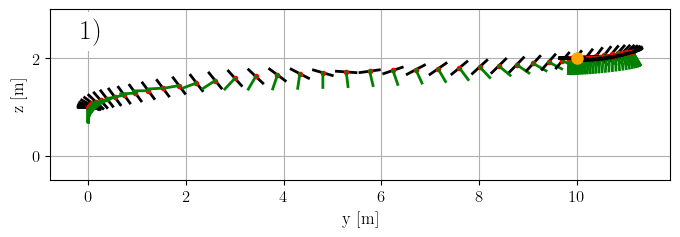

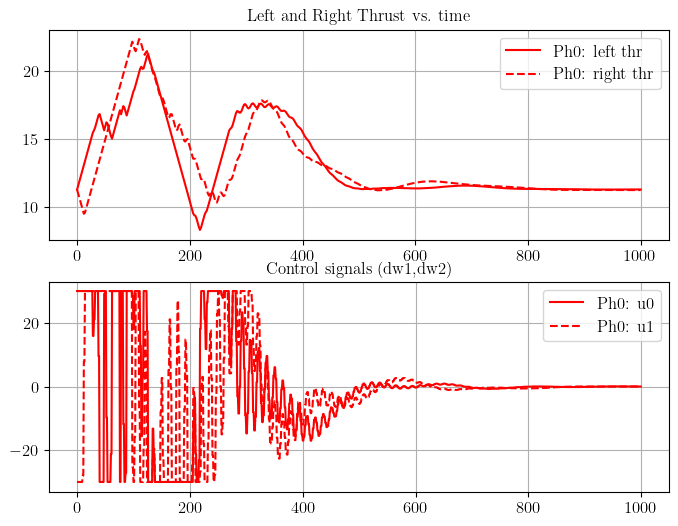

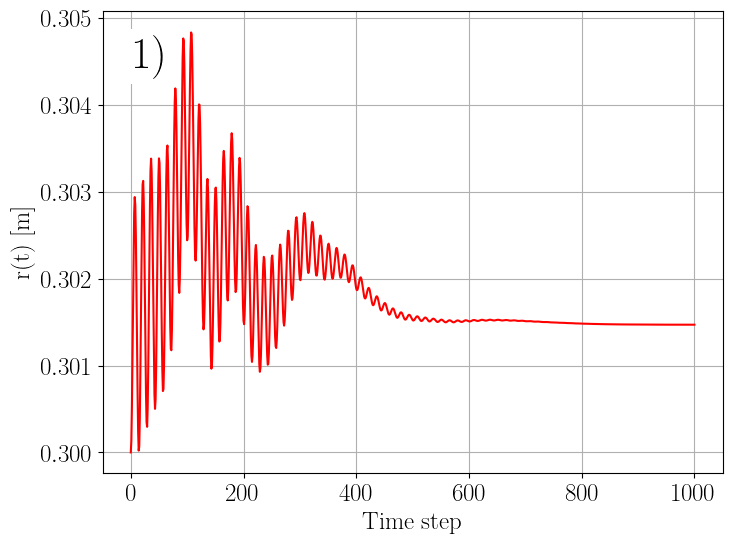

In [6]:
### 1) Myopic MPC ###
mpc_opts_1 = deepcopy(opts)
N = 100
mpc_opts_1.N = N
mpc_opts_1.step_sizes = [dt_inital_mpc]*N
mpc_opts_1.switch_stage = N+1
mpc_opts_1.integrator_type = "ERK"
mpc_opts_1.levenberg_marquardt = 8e-3
mpc_1 = DroneMPC(mpc_opts_1)

mpc_1.set_initial_guess(X0, u_guess=np.zeros(2))

# simulate
x_traj, u_traj, stage_costs, solve_times, SQP_iters = simulate_closed_loop_drone(
    X0, 
    mpc_1, 
    duration, 
    target_xy=pos_ref,
    stage_cost_function=stage_cost_function,
    sigma_noise=0.0,  
    sim_solver=sim_solver, 
    control_step=control_step
)

plot_drone_mpc_solution(
    mpc=mpc_1, 
    reference_xy=pos_ref,
    closed_loop_traj=x_traj,
    u_traj=u_traj,
    step_pose=10,
    number=1,
    legend=False,
    save=save,
    latexify=latexify
)

mean_costs.append(np.mean(stage_costs))
mean_solve_times.append(np.mean(solve_times))
solve_times_pre_iter = [t / i if i != 0 else 0 for t, i in zip(solve_times, SQP_iters)]
mean_solve_time_per_iter.append(np.mean(solve_times_pre_iter))

del mpc_1
gc.collect()
shutil.rmtree('c_generated_code', ignore_errors=True)

rm -f libacados_ocp_solver_drone_full_1748694027838.so
rm -f drone_full_1748694027838_cost/drone_full_1748694027838_cost_y_0_fun.o drone_full_1748694027838_cost/drone_full_1748694027838_cost_y_0_fun_jac_ut_xt.o drone_full_1748694027838_cost/drone_full_1748694027838_cost_y_0_hess.o drone_full_1748694027838_cost/drone_full_1748694027838_cost_y_fun.o drone_full_1748694027838_cost/drone_full_1748694027838_cost_y_fun_jac_ut_xt.o drone_full_1748694027838_cost/drone_full_1748694027838_cost_y_hess.o drone_full_1748694027838_cost/drone_full_1748694027838_cost_y_e_fun.o drone_full_1748694027838_cost/drone_full_1748694027838_cost_y_e_fun_jac_ut_xt.o drone_full_1748694027838_cost/drone_full_1748694027838_cost_y_e_hess.o acados_solver_drone_full_1748694027838.o
cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Work

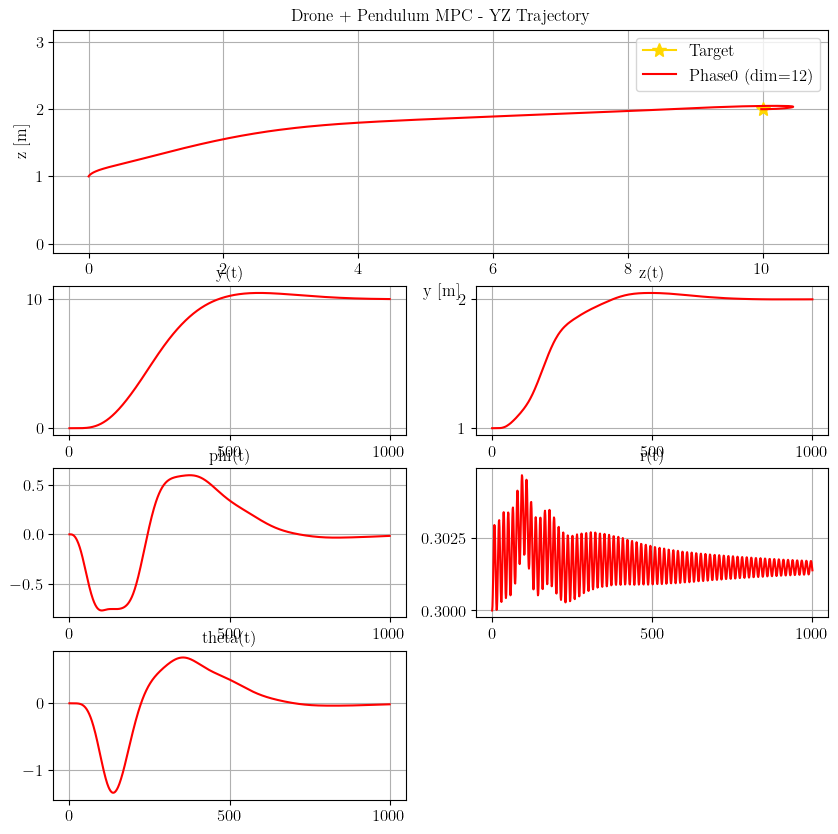

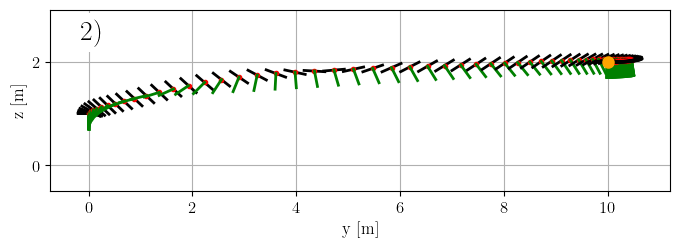

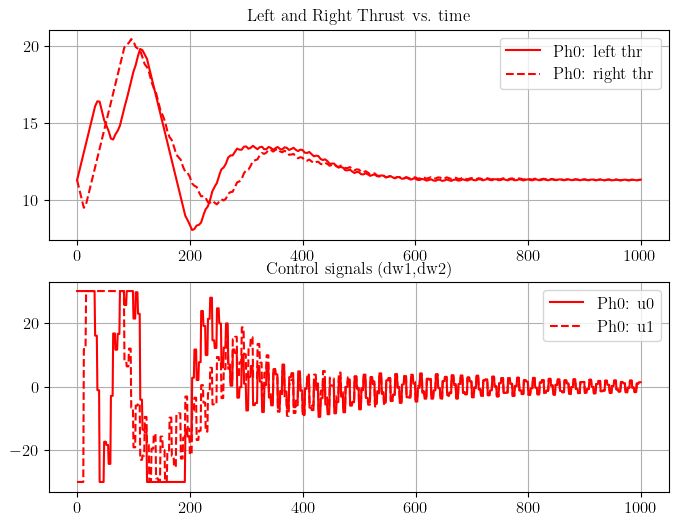

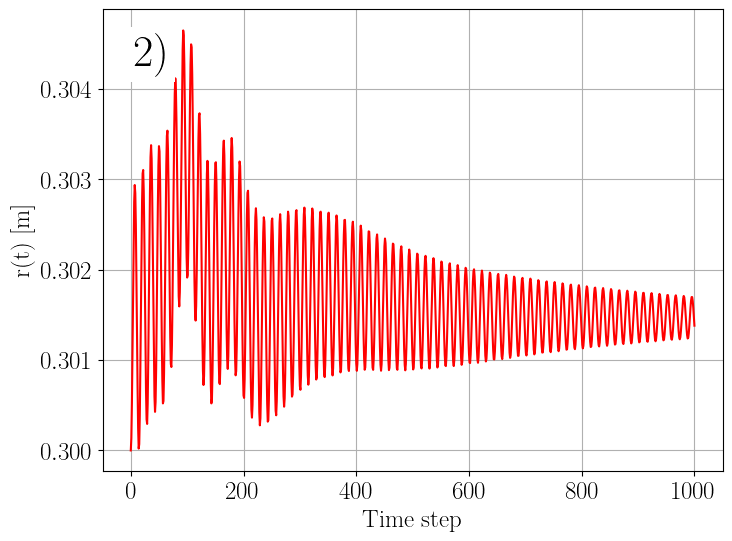

In [7]:
### 2) Larger Step Sizes, Lower Frequency ###
mpc_opts_2 = deepcopy(opts)
N = 75
mpc_opts_2.N = N
mpc_opts_2.step_sizes = [2*dt_inital_mpc]*N
mpc_opts_2.switch_stage = N+1
mpc_opts_2.integrator_type = "ERK"
mpc_opts_2.levenberg_marquardt = 8e-3
mpc_2 = DroneMPC(mpc_opts_2)

mpc_2.set_initial_guess(X0, u_guess=np.zeros(2))

# simulate
x_traj, u_traj, stage_costs, solve_times, SQP_iters = simulate_closed_loop_drone(
    X0, 
    mpc_2, 
    duration, 
    target_xy=pos_ref,
    stage_cost_function=stage_cost_function,
    sigma_noise=0.0,  
    sim_solver=sim_solver, 
    control_step=2*control_step
)

plot_drone_mpc_solution(
    mpc=mpc_2, 
    reference_xy=pos_ref,
    closed_loop_traj=x_traj,
    u_traj=u_traj,
    step_pose=10,
    number=2,
    legend=False,
    save=save,
    latexify=latexify
)

mean_costs.append(np.mean(stage_costs))
mean_solve_times.append(np.mean(solve_times))
solve_times_pre_iter = [t / i if i != 0 else 0 for t, i in zip(solve_times, SQP_iters)]
mean_solve_time_per_iter.append(np.mean(solve_times_pre_iter))

del mpc_2
gc.collect()
shutil.rmtree('c_generated_code', ignore_errors=True)

rm -f libacados_ocp_solver_drone_rigidpend_1748694107064.so
rm -f drone_rigidpend_1748694107064_cost/drone_rigidpend_1748694107064_cost_y_0_fun.o drone_rigidpend_1748694107064_cost/drone_rigidpend_1748694107064_cost_y_0_fun_jac_ut_xt.o drone_rigidpend_1748694107064_cost/drone_rigidpend_1748694107064_cost_y_0_hess.o drone_rigidpend_1748694107064_cost/drone_rigidpend_1748694107064_cost_y_fun.o drone_rigidpend_1748694107064_cost/drone_rigidpend_1748694107064_cost_y_fun_jac_ut_xt.o drone_rigidpend_1748694107064_cost/drone_rigidpend_1748694107064_cost_y_hess.o drone_rigidpend_1748694107064_cost/drone_rigidpend_1748694107064_cost_y_e_fun.o drone_rigidpend_1748694107064_cost/drone_rigidpend_1748694107064_cost_y_e_fun_jac_ut_xt.o drone_rigidpend_1748694107064_cost/drone_rigidpend_1748694107064_cost_y_e_hess.o acados_solver_drone_rigidpend_1748694107064.o
cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_M

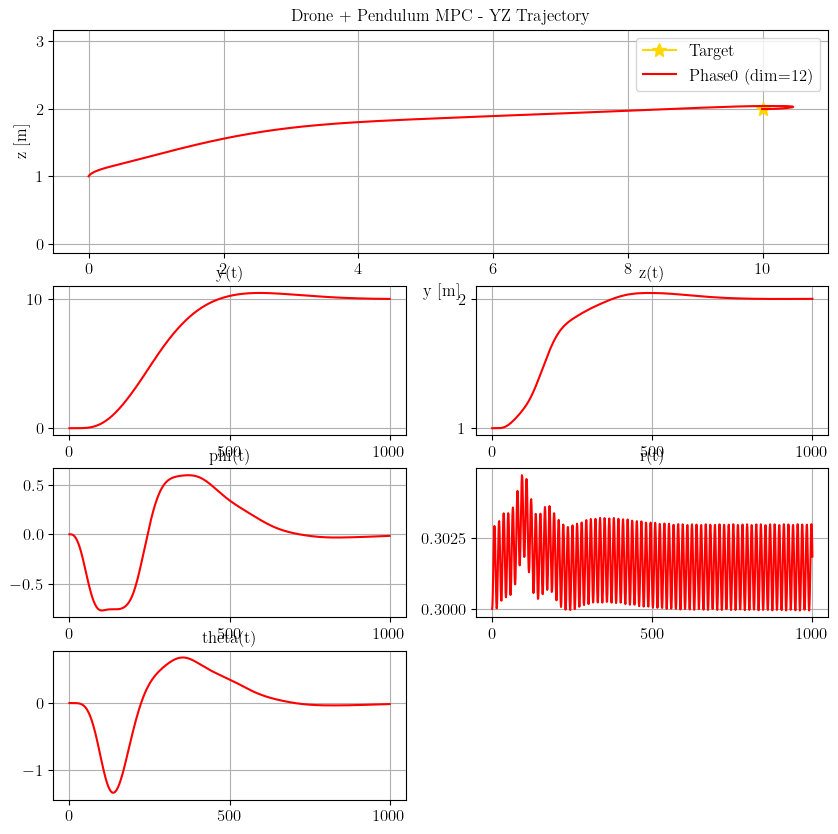

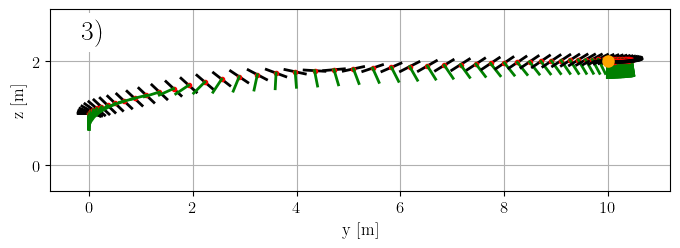

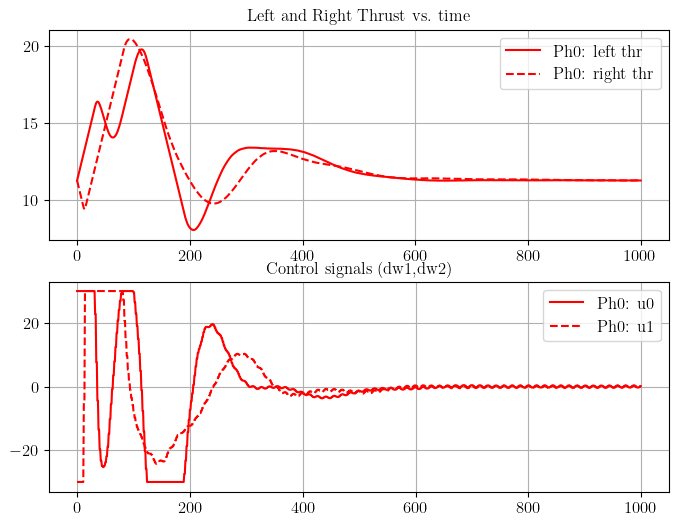

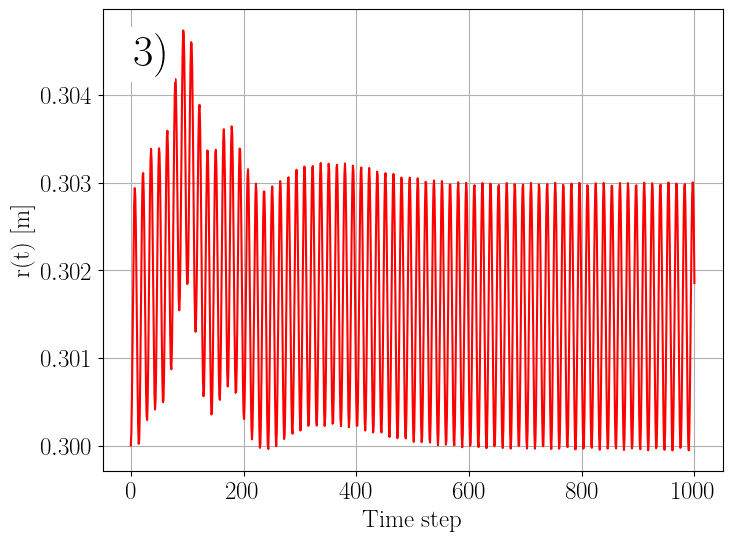

In [8]:
### 3)  Approximate model only ###
mpc_opts_3 = deepcopy(opts)
N = 150
mpc_opts_3.N = N
mpc_opts_3.step_sizes = [dt_inital_mpc]*N
mpc_opts_3.switch_stage = 0
mpc_opts_3.integrator_type = "ERK"
mpc_opts_3.levenberg_marquardt = 8e-3
mpc_3 = DroneMPC(mpc_opts_3)

mpc_3.set_initial_guess(X0, u_guess=np.zeros(2))

# simulate
x_traj, u_traj, stage_costs, solve_times, SQP_iters = simulate_closed_loop_drone(
    X0, 
    mpc_3, 
    duration, 
    target_xy=pos_ref,
    stage_cost_function=stage_cost_function,
    sigma_noise=0.0,  
    sim_solver=sim_solver, 
    control_step=control_step
)

plot_drone_mpc_solution(
    mpc=mpc_3, 
    reference_xy=pos_ref,
    closed_loop_traj=x_traj,
    u_traj=u_traj,
    step_pose=10,
    number=3,
    legend=False,
    save=save,
    latexify=latexify
)

mean_costs.append(np.mean(stage_costs))
mean_solve_times.append(np.mean(solve_times))
solve_times_pre_iter = [t / i if i != 0 else 0 for t, i in zip(solve_times, SQP_iters)]
mean_solve_time_per_iter.append(np.mean(solve_times_pre_iter))

del mpc_3
gc.collect()
shutil.rmtree('c_generated_code', ignore_errors=True)

rm -f libacados_ocp_solver_drone_full_1748694273871.so
rm -f drone_full_1748694273871_cost/drone_full_1748694273871_cost_y_0_fun.o drone_full_1748694273871_cost/drone_full_1748694273871_cost_y_0_fun_jac_ut_xt.o drone_full_1748694273871_cost/drone_full_1748694273871_cost_y_0_hess.o drone_full_1748694273871_cost/drone_full_1748694273871_cost_y_fun.o drone_full_1748694273871_cost/drone_full_1748694273871_cost_y_fun_jac_ut_xt.o drone_full_1748694273871_cost/drone_full_1748694273871_cost_y_hess.o drone_full_1748694273871_cost/drone_full_1748694273871_cost_y_e_fun.o drone_full_1748694273871_cost/drone_full_1748694273871_cost_y_e_fun_jac_ut_xt.o drone_full_1748694273871_cost/drone_full_1748694273871_cost_y_e_hess.o acados_solver_drone_full_1748694273871.o
cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Work

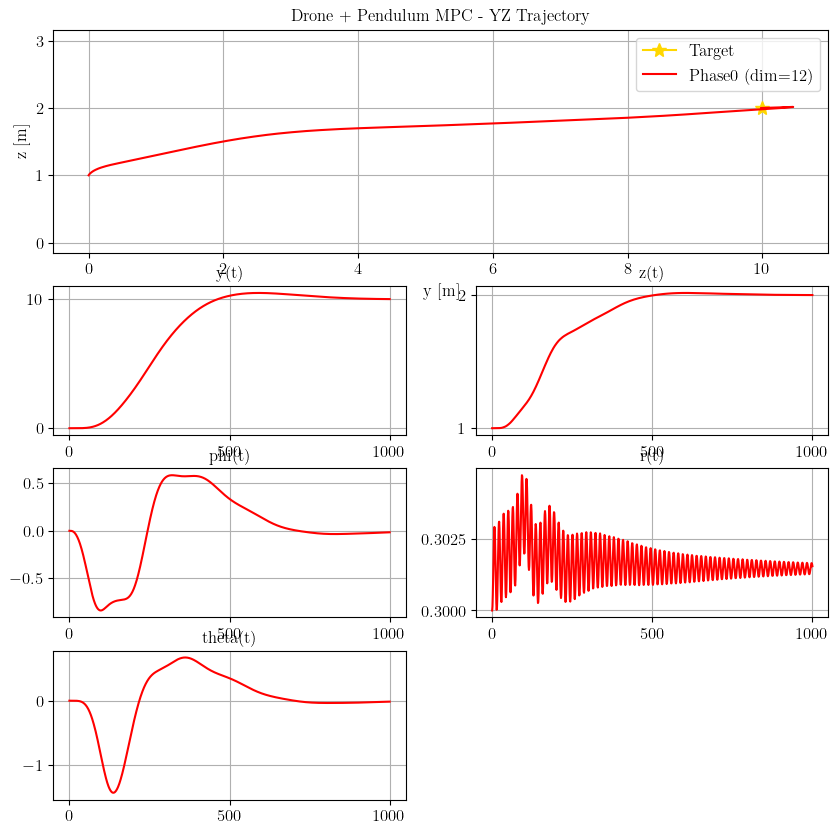

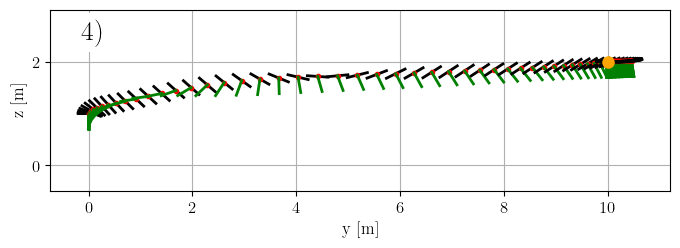

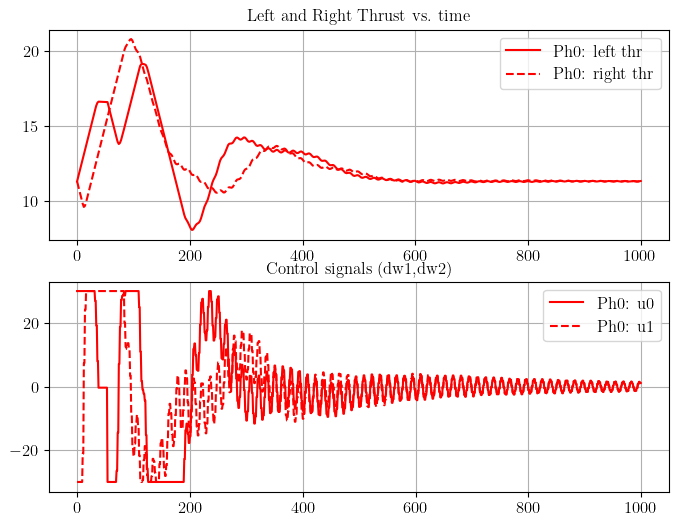

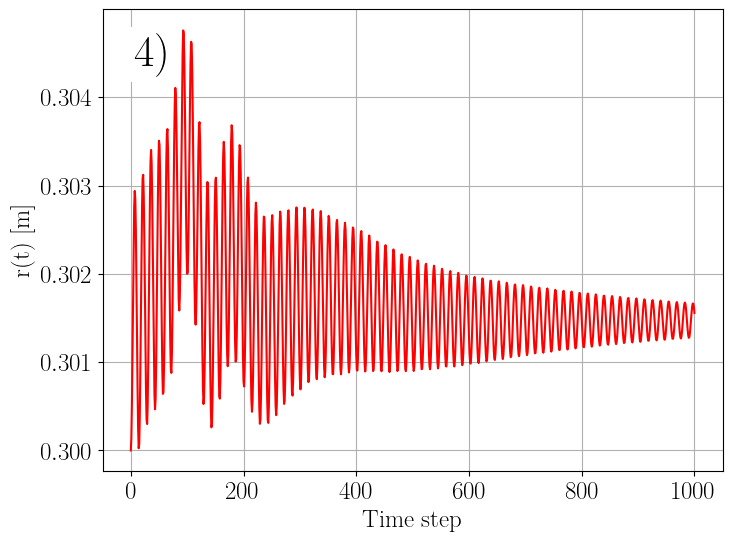

In [9]:
### 4) Exponential increase in stepsizes ###
from utils_shared import compute_exponential_step_sizes
mpc_opts_4 = deepcopy(opts)
N = 75
mpc_opts_4.N = N
mpc_opts_4.step_sizes = compute_exponential_step_sizes(
    dt_initial=dt_inital_mpc,
    T_total=dt_inital_mpc*150,
    N_steps=N,
    plot=False
)
mpc_opts_4.switch_stage = N+1
mpc_opts_4.integrator_type = "ERK"
mpc_opts_4.levenberg_marquardt = 8e-3 
mpc_4 = DroneMPC(mpc_opts_4)

mpc_4.set_initial_guess(X0, u_guess=np.zeros(2))

# simulate
x_traj, u_traj, stage_costs, solve_times, SQP_iters = simulate_closed_loop_drone(
    X0, 
    mpc_4, 
    duration, 
    target_xy=pos_ref,
    stage_cost_function=stage_cost_function,
    sigma_noise=0.0,  
    sim_solver=sim_solver, 
    control_step=control_step
)

plot_drone_mpc_solution(
    mpc=mpc_4, 
    reference_xy=pos_ref,
    closed_loop_traj=x_traj,
    u_traj=u_traj,
    step_pose=10,
    number=4,
    legend=False,
    save=save,
    latexify=latexify
)

mean_costs.append(np.mean(stage_costs))
mean_solve_times.append(np.mean(solve_times))
solve_times_pre_iter = [t / i if i != 0 else 0 for t, i in zip(solve_times, SQP_iters)]
mean_solve_time_per_iter.append(np.mean(solve_times_pre_iter))

del mpc_4
gc.collect()
shutil.rmtree('c_generated_code', ignore_errors=True)

The option alpha_min is deprecated and has new name: globalization_alpha_min
The option alpha_reduction is deprecated and has new name: globalization_alpha_reduction
The option eps_sufficient_descent is deprecated and has new name: globalization_line_search_use_sufficient_descent
The option full_step_dual is deprecated and has new name: globalization_full_step_dual
The option line_search_use_sufficient_descent is deprecated and has new name: globalization_line_search_use_sufficient_descent
The option nlp_solver_step_length is deprecated and has new name: globalization_fixed_step_length
The option alpha_min is deprecated and has new name: globalization_alpha_min
The option alpha_min is deprecated and has new name: globalization_alpha_min
The option alpha_reduction is deprecated and has new name: globalization_alpha_reduction
The option alpha_reduction is deprecated and has new name: globalization_alpha_reduction
The option eps_sufficient_descent is deprecated and has new name: globaliza

acados_solver_multiphase_ocp_75_1_75_20250531_052633_551107.c: In function ‘multiphase_ocp_75_1_75_20250531_052633_551107_acados_create_with_discretization’:
acados_solver_multiphase_ocp_75_1_75_20250531_052633_551107.c:2088:25: warning: too many arguments for format [-Wformat-extra-args]
 2088 |         fprintf(stderr, "multiphase_ocp_75_1_75_20250531_052633_551107_acados_create_with_discretization: new_time_steps should be NULL " \
      |                         ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/blasfeo/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/hpipm/include  -c -o drone_full_1748694393551_model/drone_full_1748694393551_expl_ode_fun.o drone_full_1748694393551_model/drone_full_1748694393551_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/blasfeo/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/hpipm/include  -c -o drone_full_1748694393551_model/drone_full_1748694393551_expl_vde_forw.o drone_full_1748694393551_model/dro

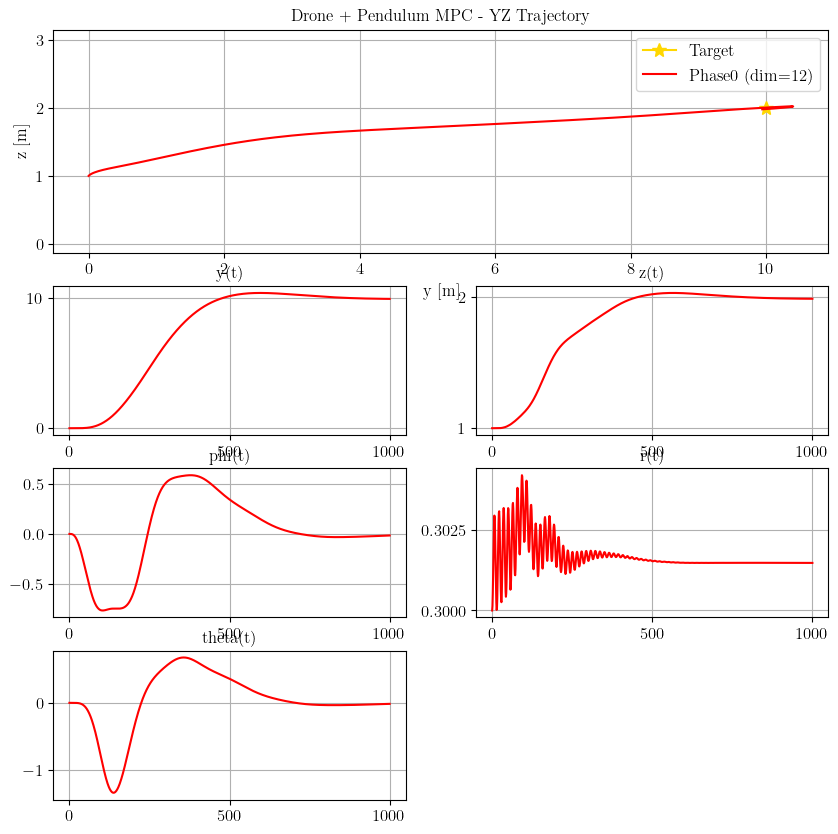

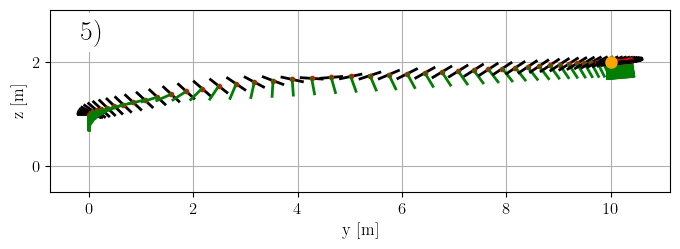

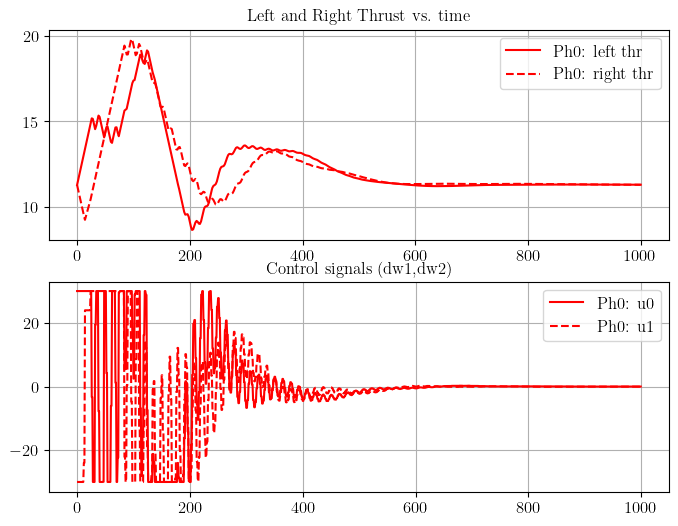

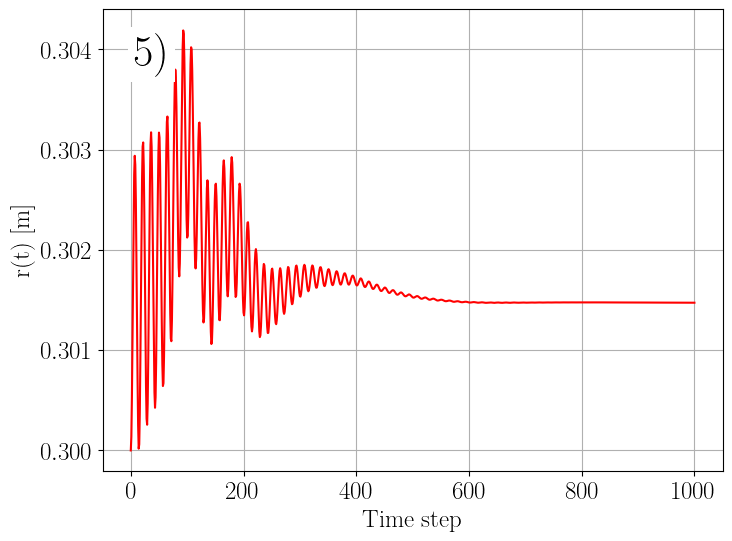

In [10]:
### 5) Only model switching ###
mpc_opts_5 = deepcopy(opts)
N = 150
mpc_opts_5.N = N
mpc_opts_5.step_sizes = [dt_inital_mpc]*N
mpc_opts_5.switch_stage = 75
mpc_opts_5.integrator_type = "ERK"
mpc_opts_5.levenberg_marquardt = 8e-3
mpc_5 = DroneMPC(mpc_opts_5)

mpc_5.set_initial_guess(X0, u_guess=np.zeros(2))

# simulate
x_traj, u_traj, stage_costs, solve_times, SQP_iters = simulate_closed_loop_drone(
    X0, 
    mpc_5, 
    duration, 
    target_xy=pos_ref,
    stage_cost_function=stage_cost_function,
    sigma_noise=0.0,  
    sim_solver=sim_solver, 
    control_step=control_step
)

plot_drone_mpc_solution(
    mpc=mpc_5, 
    reference_xy=pos_ref,
    closed_loop_traj=x_traj,
    u_traj=u_traj,
    step_pose=10,
    number=5,
    legend=False,
    save=save,
    latexify=latexify
)

mean_costs.append(np.mean(stage_costs))
mean_solve_times.append(np.mean(solve_times))
solve_times_pre_iter = [t / i if i != 0 else 0 for t, i in zip(solve_times, SQP_iters)]
mean_solve_time_per_iter.append(np.mean(solve_times_pre_iter))

del mpc_5
gc.collect()
shutil.rmtree('c_generated_code', ignore_errors=True)

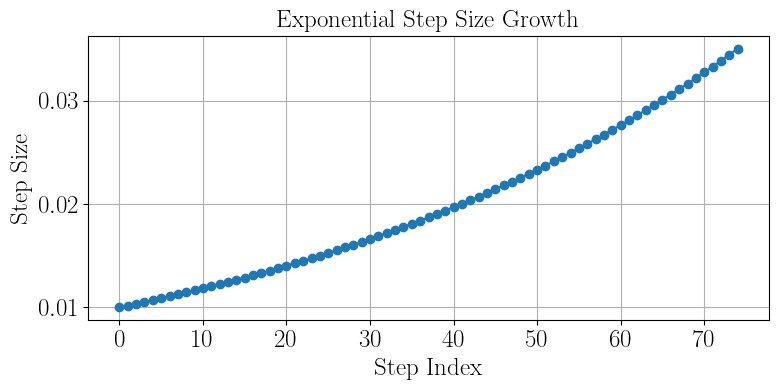

The option alpha_min is deprecated and has new name: globalization_alpha_min
The option alpha_reduction is deprecated and has new name: globalization_alpha_reduction
The option eps_sufficient_descent is deprecated and has new name: globalization_line_search_use_sufficient_descent
The option full_step_dual is deprecated and has new name: globalization_full_step_dual
The option line_search_use_sufficient_descent is deprecated and has new name: globalization_line_search_use_sufficient_descent
The option nlp_solver_step_length is deprecated and has new name: globalization_fixed_step_length
The option alpha_min is deprecated and has new name: globalization_alpha_min
The option alpha_min is deprecated and has new name: globalization_alpha_min
The option alpha_reduction is deprecated and has new name: globalization_alpha_reduction
The option alpha_reduction is deprecated and has new name: globalization_alpha_reduction
The option eps_sufficient_descent is deprecated and has new name: globaliza

acados_solver_multiphase_ocp_35_1_40_20250531_052932_879026.c: In function ‘multiphase_ocp_35_1_40_20250531_052932_879026_acados_create_with_discretization’:
acados_solver_multiphase_ocp_35_1_40_20250531_052932_879026.c:1713:25: warning: too many arguments for format [-Wformat-extra-args]
 1713 |         fprintf(stderr, "multiphase_ocp_35_1_40_20250531_052932_879026_acados_create_with_discretization: new_time_steps should be NULL " \
      |                         ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/blasfeo/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/hpipm/include  -c -o drone_full_1748694572879_model/drone_full_1748694572879_expl_ode_fun.o drone_full_1748694572879_model/drone_full_1748694572879_expl_ode_fun.c
cc -fPIC -std=c99   -O2 -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/acados -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/blasfeo/include -I/home/lukas/ETH_Zuerich/ASL_Stanford_Masterthesis/Workspace/acados/include/hpipm/include  -c -o drone_full_1748694572879_model/drone_full_1748694572879_expl_vde_forw.o drone_full_1748694572879_model/dro

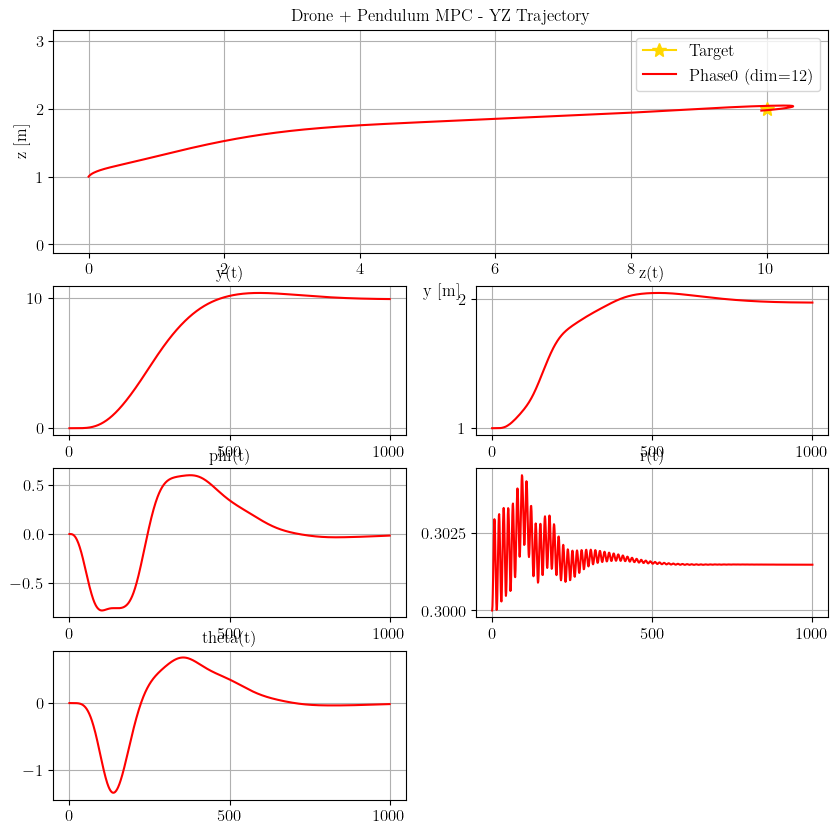

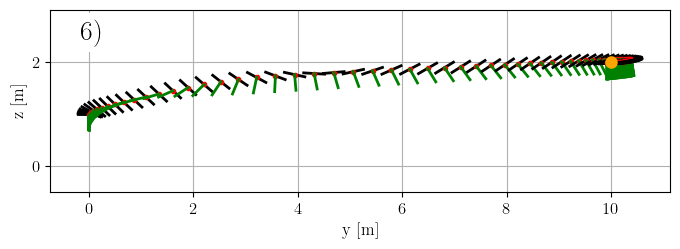

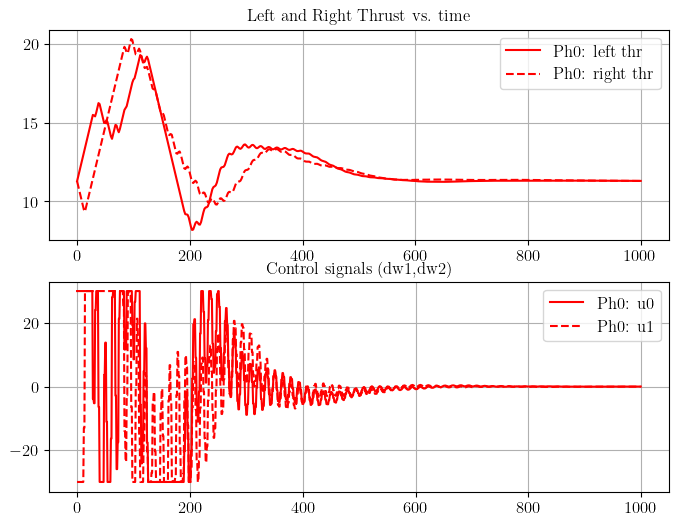

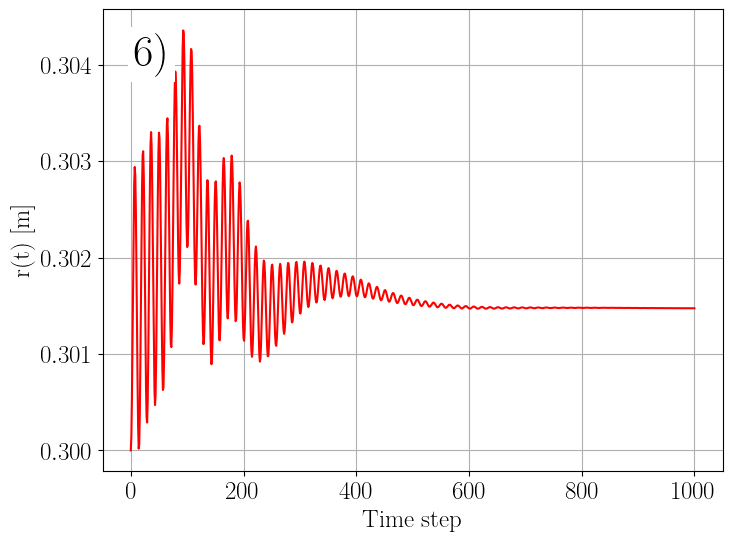

In [11]:
### 6) Ours: Model switching with exponential increase in stepsizes ###
from utils_shared import compute_exponential_step_sizes
mpc_opts_6 = deepcopy(opts)
N = 75
mpc_opts_6.N = N
mpc_opts_6.step_sizes = compute_exponential_step_sizes(
    dt_initial=dt_inital_mpc,
    T_total=dt_inital_mpc*150,
    N_steps=N,
    plot=True
)
mpc_opts_6.switch_stage = 35
mpc_opts_6.integrator_type = "ERK"
mpc_opts_6.levenberg_marquardt = 8e-3 
mpc_6 = DroneMPC(mpc_opts_6)

mpc_6.set_initial_guess(X0, u_guess=np.zeros(2))

# simulate
x_traj, u_traj, stage_costs, solve_times, SQP_iters = simulate_closed_loop_drone(
    X0, 
    mpc_6, 
    duration, 
    target_xy=pos_ref,
    stage_cost_function=stage_cost_function,
    sigma_noise=0.0,  
    sim_solver=sim_solver, 
    control_step=control_step
)

plot_drone_mpc_solution(
    mpc=mpc_6, 
    reference_xy=pos_ref,
    closed_loop_traj=x_traj,
    u_traj=u_traj,
    step_pose=10,
    number=6,
    legend=False,
    save=save,
    latexify=latexify
)

mean_costs.append(np.mean(stage_costs))
mean_solve_times.append(np.mean(solve_times))
solve_times_pre_iter = [t / i if i != 0 else 0 for t, i in zip(solve_times, SQP_iters)]
mean_solve_time_per_iter.append(np.mean(solve_times_pre_iter))

del mpc_6
gc.collect()
shutil.rmtree('c_generated_code', ignore_errors=True)

Run the following cell to safe/load a results file.

In [12]:
# save results or load them

import os
import pickle
from utils_shared import get_dir

data_dir = get_dir("data")
results_file = data_dir / "drone/drone_results.pkl" 
# Note that the safed results file is a rerun of the results included in the thesis.
# This is as this the original results were not yet saved, but only figures and tables created based on it.
# However the result file is completely equivalent: same closed-loop cost,
# but naturally a minimal deviation in solve times, as solver timings show
# some small variance. I included this results file to show the timings on
# my machine.

if os.path.exists(results_file):
    with open(results_file, 'rb') as f:
        data = pickle.load(f)
    mean_costs = data['mean_costs']
    mean_solve_times = data['mean_solve_times']
    mean_solve_time_per_iter = data['mean_solve_time_per_iter']
else:
    # (Here assume mean_costs, mean_solve_times, mean_solve_time_per_iter are just computed)
    data = {
        'mean_costs': mean_costs,
        'mean_solve_times': mean_solve_times,
        'mean_solve_time_per_iter': mean_solve_time_per_iter
    }
    os.makedirs(os.path.dirname(results_file), exist_ok=True)
    with open(results_file, 'wb') as f:
        pickle.dump(data, f)

Next, we create bar plots and a pareto frontier of the observed closed-loop costs, solve times and solve times per SQP iteration. 

In [13]:
# Plotting options for the following plots
latexify=True
save=True

In [14]:
print(mean_costs)
print(mean_solve_times)
print(mean_solve_time_per_iter)

[25.070144275703424, 26.661222645126486, 26.043134245359433, 29.42808470937856, 26.14513814682428, 25.108878760170743, 25.147576801701703]
[0.641298366, 0.42618352200000004, 0.27585017199999995, 0.316442272, 0.21826324, 0.330158626, 0.170513284]
[0.016435591790979323, 0.010157673869037624, 0.005178807569249382, 0.008395277207004365, 0.005485120788908436, 0.00954095737862727, 0.004107877760623563]


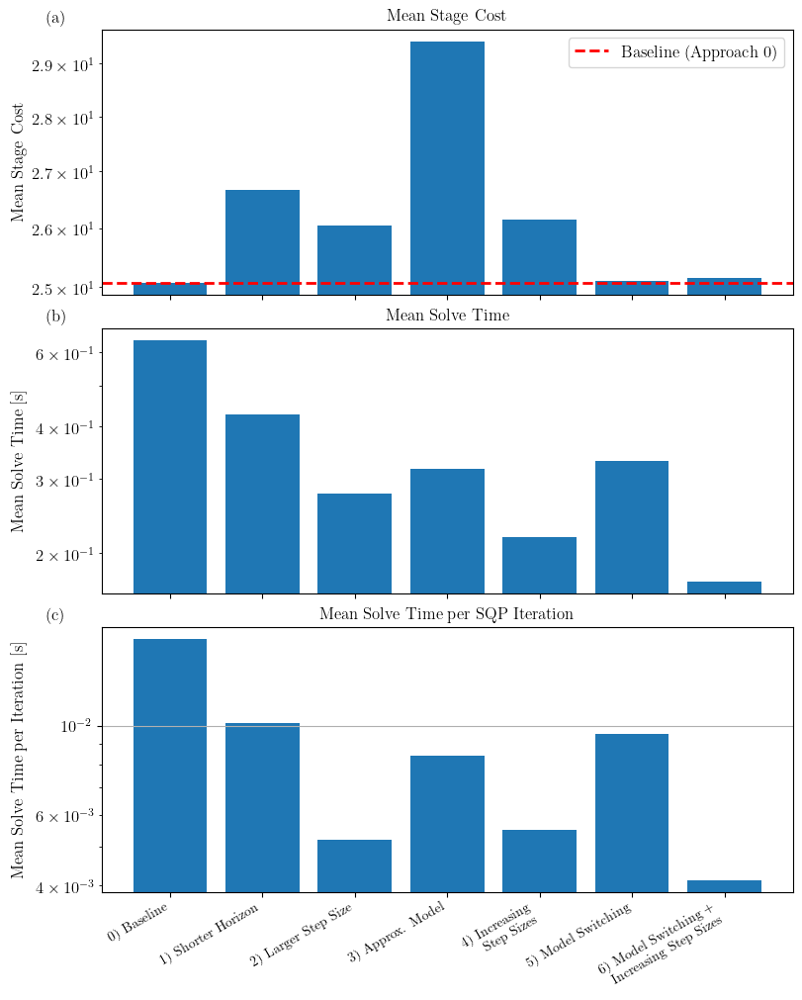

In [15]:
import matplotlib.pyplot as plt
from acados_template import latexify_plot
from plotting_utils_shared import barplot

# Data: mean_costs, mean_solve_times, mean_solve_times_per_iter should be defined already
approach_labels = [
    '0) Baseline',
    '1) Shorter Horizon',
    '2) Larger Step Size',
    '3) Approx. Model',
    '4) Increasing\n    Step Sizes',
    '5) Model Switching',
    '6) Model Switching +\n    Increasing Step Sizes'
]

barplot(
    approach_labels,
    mean_costs,
    mean_solve_times,
    mean_solve_time_per_iter,
    subpath="drone/drone_barplot.pgf",
    latexify=latexify,
    save=save,
    figsize=(8, 10),
    fontsize=12,
)

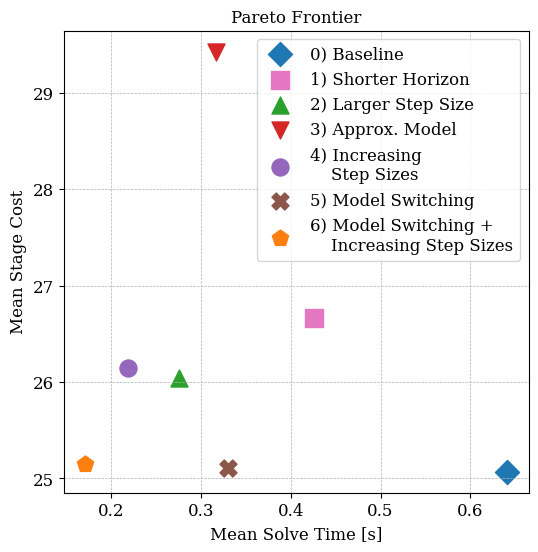

In [16]:
import matplotlib.pyplot as plt
from plotting_utils_shared import pareto_frontier

# distinct symbols per approach
markers = ['D', 's', '^', 'v', 'o', 'X', 'p']

# NEW: marker sizes per approach (indexed same as markers)
marker_sizes = [150, 150, 150, 150, 150, 150, 150]  # customize these

approach_labels = [
    '0) Baseline',
    '1) Shorter Horizon',
    '2) Larger Step Size',
    '3) Approx. Model',
    '4) Increasing\n    Step Sizes',
    '5) Model Switching',
    '6) Model Switching +\n    Increasing Step Sizes'
]

pareto_frontier(
    mean_solve_times,
    mean_costs,
    approach_labels,
    markers,
    marker_sizes,
    subpath="drone/pareto_front_drone.pdf",
    latexify=latexify,
    save=save,
    figsize=(6, 6),
    fontsize=12,
    x_lim=None,
    x_nonlog=True,
    y_nonlog=True
)
